In [2]:
import csv
import community
import pandas as pd
import networkx as nx
import math
import matplotlib.pyplot as plt
import pickle
nodelist = pd.read_csv("SNA_nodelist_grants_with_years.csv", usecols=[0,1,2,3,4,5,6])
edgelist = pd.read_csv("SNA_edgelist.csv", usecols=[0,1])
nodelist

,Id,Label,timeset,attr_type,global_occurrences,attr_2_4,attr_2_6
0,grantnumber_e388bd64c1fc61e7a6121722c6888b16,grant number (fa_reference),NaN,grantNumber,1,NaN,NaN
1,grantnumber_bb8b791b83177a2a19a6d9926a930d01,nnf08cc1016518,NaN,grantNumber,40,Grant,2009.0
2,grantnumber_b1817369c500f6f3969ded283efd876a,nnf09oc1012073,NaN,grantNumber,19,Grant,2009.0
3,grantnumber_c09823961870565d6322563133bb3884,nnf10cc1016515,NaN,grantNumber,1311,Grant,2010.0
4,grantnumber_0c48b3f6980e5c15e606ff96f0183fbc,nnf10cc1016517,NaN,grantNumber,2434,Grant,2011.0
5,grantnumber_3cda1ceacdd871e27b4eca004e820367,nnf10oc1013203,NaN,grantNumber,41,Grant,2010.0
6,grantnumber_6bec2757ef276dee3c7a2d114aef38f1,nnf10oc1013267,NaN,grantNumber,142,Grant,2010.0
7,grantnumber_ed0abbfadc1892002b777d928e459a34,nnf10oc1013276,NaN,grantNumber,20,Grant,2010.0
8,grantnumber_487c8f3f0b8ab3a36f8feadb4e8d551b,nnf10oc1013296,NaN,grantNumber,19,Grant,2010.0
9,grantnumber_0664af9357328ec98ce02909ed5f864a,nnf10oc1013350,NaN,grantNumber,10,Grant,2010.0


In [3]:
#populate nodes with attributes
G = nx.Graph()
for index, node in nodelist.iterrows():
    G.add_node(node['Id'], type=node['attr_2_4'],year=node['attr_2_6'], label = node['Label'])

In [4]:
#G_symmetric.add_edge('Amitabh Bachchan','Abhishek Bachchan')
for index, edge in edgelist.iterrows():
    if (index > 0) : #get rid of first faulty edge
        G.add_edge(edge['Source'],edge['Target'])

grantnumber_ab520b25f59da3a42cf2db6d49f3d173
grantnumber_9ab1d72a647812d7cc2590e18a892ea8
grantnumber_71ee1a845d314ccbccc58e2fa174b5a1
grantnumber_5b0678fe604fb37cf5480a4658b08685
grantnumber_9834a4a1ef6f3d76c2e551d09f54c9fa


In [36]:
nx.nodes(G).data()

NodeDataView({'entityid_fd8d0742d0baf0cc188c57b5fb145cd8': {'label': '55dd93d72eec19.51142389', 'type': 'Publications', 'year': 2015.0}, 'entityid_e346ae5422f52453a7261b069d33c347': {'label': '58dcb9322d0d57.99902932', 'type': 'Collaborations and Partnerships', 'year': 2016.0}, 'entityid_b6462d884c5c70a62f0843e2ef51ba4b': {'label': '55b629967db851.809673621453742223', 'type': 'Publications', 'year': 2015.0}, 'entityid_de326287d3510e8f3e888fa4952652e8': {'label': '5565e77513d055.917471221437313146', 'type': 'Publications', 'year': 2015.0}, 'entityid_092ef612b821bd7667bd51a478d7b037': {'label': '584545a212d9b6.04101846', 'type': 'Publications', 'year': 2016.0}, 'entityid_562c46fc04916595517f9a2b21ddbacf': {'label': '5a5e31df8398d7.32105332-1', 'type': 'Collaborators', 'year': nan}, 'entityid_caa817aeb1031d777aad84f17d085754': {'label': '5a58a7012c7251.19571052', 'type': 'Engagement Activities', 'year': 2016.0}, 'entityid_58fd44107ecb2c2716d25d7f611c6a34': {'label': '55d4402a902862.974365

In [7]:
#gets earliest year of all neighbours
#for cleaning purposes
def getNeighborYear(node):
    #print node
    result = 5000
    for neighbor in G.neighbors(node):
        neighborYear = G.node[neighbor]['year']
        #print neighbor, neighborYear
        if result > neighborYear:
            result = neighborYear 
    return result;

In [8]:
getNeighborYear('entityid_424dd6297018ed1f27471fdb26289294')

2013.0

In [9]:
#this is for cleaning nodes with missing years
#if node is missing a year, we take year from the neighboring grant
#if there are multiple neighbouring grant, we take the earliest year
for node,fields in G.nodes(data=True):
    #print u, outer_d['type'], outer_d['year']
    if math.isnan(fields['year']):
        neighbors = G.neighbors(node)
        #print len(list(neighbors))
        if len(list(neighbors))>0:
            nodeYear = getNeighborYear(node)
            fields['year'] = nodeYear
            print node, fields['type'], fields['year']
        #print node, fields['type'], fields['year']

entityid_d0b2dd4f34576934a3a6a20ef623abb3 Collaborators 2014.0
entityid_562c46fc04916595517f9a2b21ddbacf Collaborators 2017.0
entityid_efeca8f42de187411a5a01a0271d2e34 Publications 2014.0
entityid_e9e5a81a11978a59366056e5cf6bdbda Collaborators 2012.0
entityid_9c21de52376e4d4428b687a3b0f663b9 Collaborators 2015.0
entityid_616bbed7144d70ff681606966ccdc670 Collaborators 2014.0
entityid_9ae3a735461ed5510881c7fe37289e3e Collaborators 2014.0
entityid_1524a5e86c2daa4b9330962f726e5a98 Collaborators 2014.0
entityid_3bc9b2e69d70632702f80c4ea5e67608 Research Tools & Methods 2014.0
entityid_37a40a3902ae200e3247d3a22e6c9261 Collaborators 2014.0
entityid_758ff5d4ad705eec987c138886caefa5 Collaborators 2014.0
entityid_af2a78dd592bc263336ccd297a852745 Publications 2012.0
entityid_734a9ec05b4ddae97bed660e2272b667 Collaborators 2010.0
entityid_498d5122dc84a626caf109459b947f56 Collaborators 2015.0
entityid_e2cd6dbc94f3a243751df48723940031 Research Tools & Methods 2016.0
entityid_a85d2aa0417882e4330e6d420a

entityid_30fc402c683386509ba5de2a98b07f6d Collaborators 2013.0
entityid_01a0ecbb4b37a7d003bcb499ddd9308f Collaborators 2010.0
entityid_c7a7df9c819b9cb23a2dd5183d7c80f3 Collaborators 2015.0
entityid_99106a3b004088c09f04993660165939 Other Outputs & Knowledge / Future Steps 2017.0
entityid_aa113391e803221086f4ecfbbebe81d2 Other Outputs & Knowledge / Future Steps 2016.0
entityid_0851dde0376c6a2d777dc6d55a7e841f Publications 2013.0
entityid_cdafa5110a008ef6577bb722578c82dc Collaborators 2015.0
entityid_29c202bed434b28f7748992d90752bc1 Research Tools & Methods 2011.0
entityid_246fdd78da7b865a6af26a8ea9e38948 Collaborators 2010.0
entityid_1896f3f9429baadfa67c29cf23718b89 Other Outputs & Knowledge / Future Steps 2017.0
entityid_c9cadae915d1c4bb8a916ed82f610950 Collaborators 2014.0
entityid_c88cb8eb0bf4210a3aee8f22797ce456 Other Outputs & Knowledge / Future Steps 2013.0
entityid_90e03bb36fcea62b7e790aa5e0a30ec3 Next Destination 2016.0
entityid_ad6db506bebb8fbebd833f73aaffa647 Other Outputs & Kn

entityid_3cde5a62cb65bc6f6bdf594e82314700 Collaborators 2015.0
entityid_334633397b22a99ada4ca92568807777 Use of Facilities & Resources 2016.0
entityid_6550977e2c5002ecdb9fa7c9b9a0b504 Collaborators 2016.0
entityid_13b015400a33c2793ca020b5d55157b1 Collaborators 2007.0
entityid_9cc71fa2be9a8a33bc2a54ae92c4b849 Publications 2014.0
entityid_048f7f617e9f6f59f5505f78680d5302 Publications 2015.0
entityid_05c611362b85c5b78f04b1495f8d5842 Collaborators 2014.0
entityid_2991c1c3778a56ca11b77109b82a0900 Collaborators 2014.0
entityid_0e8b5a8f2a3cad9c73bb89e0c1cb63ac Collaborators 2015.0
entityid_324aae55bd43609c7ee5566e8f88f389 Intellectual Property & Licensing 2015.0
entityid_8d3b89aa8480b1d9e11a4d9096b844ea Other Outputs & Knowledge / Future Steps 2017.0
entityid_78afed71d366f573ed01366b642c5260 Collaborators 2013.0
entityid_028b06e480c28d8fb0c303e20c588da4 Collaborators 2015.0
entityid_56dc1f275d8d85ef4fbc4230bc26831c Publications 2015.0
entityid_e6d87190b99c1d723892e42b37a9d10f Collaborators 20

entityid_8d14fb115321ac8e00305f07070784a9 Research Tools & Methods 2017.0
entityid_b78d2372141e80f60c98584f9914877f Collaborators 2017.0
entityid_e7510e2758c5d57d41e0b0710bb5fed8 Collaborators 2007.0
entityid_bf58c8667d27d0904664da3421c03649 Research Tools & Methods 2014.0
entityid_514703dd78e8bec932205e0d2018c987 Collaborators 2007.0
entityid_0223d97efb2a3f0a12d662689a4ae2ce Collaborators 2014.0
entityid_6b9b58fe6fc2f5bbc577ba73cee0626f Next Destination 2017.0
entityid_f2d6022f7809c3e62b790fe28a3acb84 Collaborators 2014.0
entityid_ab237299d865a52f06039f2161860b15 Collaborators 2014.0
entityid_67543c4cbf5eeadc061314865af8e524 Collaborators 2011.0
entityid_dac18674505b7c4b5c2853c7129cc702 Publications 2015.0
entityid_05e915f7e2455e67ad02d977e2bca447 Publications 2015.0
entityid_0225547006da7f851a9dd72f3134ba8e Research Databases & Models 2017.0
entityid_67983f1a3934e4609a30b5cffa425195 Collaborators 2011.0
entityid_bd4cb1afc09ae7250aca710b5f79efa5 Research Tools & Methods 2014.0
entityi

entityid_f012c6a040ae388c286e90e7f5236209 Research Tools & Methods 2015.0
entityid_c0b8d46d2ff64ee5025f62e1a5320330 Next Destination 2014.0
entityid_7d0aba6a1334bc95b02a9304fbc4aac9 Next Destination 2011.0
entityid_5cec390dd472b1abc573ef64a29cb45b Collaborators 2016.0
entityid_6117a092a65600ebb5aa345c6e84a456 Use of Facilities & Resources 2017.0
entityid_ec0e94604fc514b9dd8cb9ebf9647d01 Collaborators 2011.0
entityid_66b5bfadea2113d48ce65d2fe4161589 Next Destination 2017.0
entityid_9ccd8a1e68ff64ad4da99c9413f9c132 Collaborators 2010.0
entityid_8cc626f3e3e9118b69280878b02a33a2 Other Outputs & Knowledge / Future Steps 2014.0
entityid_58a9b9930d3e94717a79116a83fa6189 Research Tools & Methods 2016.0
entityid_1c88b02e2d96a8ff601dc4c655a838e7 Other Outputs & Knowledge / Future Steps 2013.0
entityid_ed674f06a66f71f35c5edc267388d836 Publications 2013.0
entityid_19ff139c31b9c93a60d33ef737f4d0cc Other Outputs & Knowledge / Future Steps 2012.0
entityid_15be95c10eba03c992dca819fde479b2 Collaborator

entityid_cc37ba53d0f442f3814485cadea615ab Collaborators 2010.0
entityid_9ac231918c8a5308599365bf7409ade2 Collaborators 2007.0
entityid_fd6c0daec9ce3d50a2629df90092a562 Collaborators 2012.0
entityid_522a08a4ef0fc4a8110d587267c82267 Collaborators 2014.0
entityid_b8ee994bc13a6248501a29398bb05d0f Collaborators 2017.0
entityid_37cb2abb99900f5d2680b45a2865885c Next Destination 2011.0
entityid_6aaa087cf15df68d77e04245a9289d6b Research Tools & Methods 2016.0
entityid_52fb24a4ea33bf1432dd954ee3d31116 Other Outputs & Knowledge / Future Steps 2015.0
entityid_56036e0b31a2667184d26e70c1255da9 Other Outputs & Knowledge / Future Steps 2013.0
entityid_eb7f8ffaed0901ee40c1b1cd8cf6646b Collaborators 2010.0
entityid_8df2488b199e4c500e71b274f4c33f7a Intellectual Property & Licensing 2011.0
entityid_3a4ba0e34089dc3976ac7e9d1bf9e320 Collaborators 2015.0
entityid_26b3f9bbb54be22934100bde829fef0b Other Outputs & Knowledge / Future Steps 2015.0
entityid_716c5e50f76b09b843c4010027963bfc Collaborators 2010.0
ent

entityid_a57c12e7372190fc92a67c194b00e87c Intellectual Property & Licensing 2011.0
entityid_5a24a441ac6be73ab6854dfddbb2d95e Next Destination 2007.0
entityid_98212071af32f159c15bfc7f9e62e64b Collaborators 2014.0
entityid_dc2a7ca0f4b46ee447fab21aa1c34131 Collaborators 2016.0
entityid_c1a32c0857281c960fc493ba62d6fbd6 Other Outputs & Knowledge / Future Steps 2017.0
entityid_44db8b0a5cc9500b862fdac06bd5fc39 Collaborators 2015.0
entityid_de52812d94835aa85d682c25c9b166df Collaborators 2013.0
entityid_91e6f1952b22ac8d9b5f437cc644b3e3 Publications 2015.0
entityid_e9ad6474b0b49fecc39e9385f96c7d30 Collaborators 2017.0
entityid_b0f982abe0e0a3c07670a94de5870ffd Collaborators 2014.0
entityid_58da9579b2c5f3e62345ff7075667972 Collaborators 2014.0
entityid_6f97215cd77307744d0c0ba2f3f71050 Collaborators 2015.0
entityid_665bf18b0444b7afa28156d3ec699e71 Collaborators 2011.0
entityid_2f3861706b345c43c3db323b93c9cd4d Research Tools & Methods 2014.0
entityid_a77fdb2ba06aba4f6f74fc613724910e Next Destination

entityid_16d4103286bd6ff1dd7801a5a3d45398 Collaborators 2011.0
entityid_2aceeff4d645b307751819c21abb8f15 Collaborators 2013.0
entityid_0c1e7177de58617eb631c630a9832838 Intellectual Property & Licensing 2014.0
entityid_5983554361a9e49e3dc295ceb5577f63 Next Destination 2007.0
entityid_fe023d49de5c9f6c26430fb3cfb1794b Collaborators 2013.0
entityid_dac0bde2a660732970d28c96b2bfd116 Other Outputs & Knowledge / Future Steps 2015.0
entityid_4fc52940014b898fcf49c717eb738d78 Collaborators 2015.0
entityid_765705ea96939f24e5f3c8355f4b8453 Other Outputs & Knowledge / Future Steps 2015.0
entityid_d796ee2416f99d82a886876c283a75b7 Collaborators 2010.0
entityid_2b10cb4323ba8a22c50f378eb4f098e7 Other Outputs & Knowledge / Future Steps 2013.0
entityid_f8cf944d09bc312ca2d74347d9e7dea3 Use of Facilities & Resources 2015.0
entityid_48b31d63f002652c7caf5e743a6913b0 Other Outputs & Knowledge / Future Steps 2013.0
entityid_d45586ff79bdc635923d333dee12022f Research Tools & Methods 2013.0
entityid_7d1ccdebdc81f4

entityid_6d20c6fc44250cba130dd13520cd52ba Collaborators 2016.0
entityid_e5c7a022298216e6b5db4f0032ad9a98 Collaborators 2013.0
entityid_5f3848cefb3442addd8dd188f2ce2dfb Next Destination 2017.0
entityid_c813d65110858fa333de31467cbc4e55 Collaborators 2014.0
entityid_d7f7dd0994086259cfbc40f294782858 Intellectual Property & Licensing 2011.0
entityid_9e0f77c795ae190ad7e226c1afc241ec Collaborators 2011.0
entityid_7728fbaa7edceb367fa527636d34dafe Research Tools & Methods 2013.0
entityid_b437b07df0a257b7f3c67b37ab94502b Collaborators 2010.0
entityid_27666fd1dfff5be8abd3c0227237d66c Collaborators 2010.0
entityid_105fd33a8853a9ecee84f0060399b1ce Collaborators 2014.0
entityid_9c64f805fcfe10c6e4ade3171a38ccaa Other Outputs & Knowledge / Future Steps 2016.0
entityid_c3241621f6aa3ae12f66b7302106f4a7 Collaborators 2011.0
entityid_e05eaf400a6846730662d452ae175603 Other Outputs & Knowledge / Future Steps 2016.0
entityid_16b9024252637eca09c5939f13cf4e62 Other Outputs & Knowledge / Future Steps 2017.0
ent

entityid_8daa306fc71073243ea128ec52664b8f Next Destination 2009.0
entityid_9b5bd5470310992d2844ff2708bc2558 Other Outputs & Knowledge / Future Steps 2013.0
entityid_b06638aded47fdc7c6779b7a0954eb79 Collaborators 2017.0
entityid_18afb4943bd020f0fcb921760b58a4a1 Collaborators 2013.0
entityid_f82779aa8cff78003005493a52165e52 Publications 2015.0
entityid_300d4b1ce69e9d8ba190949e2599032c Collaborators 2013.0
entityid_33420a72c75fb027a0c04542335c85a2 Collaborators 2011.0
entityid_e95e696ab7fac64f7a5ee27f0975770b Publications 2012.0
entityid_aecce66ea55f6c0d06c6cb7baaf671a5 Publications 2014.0
entityid_28df0e585f7c0ddf832f93a96faa26ea Other Outputs & Knowledge / Future Steps 2011.0
entityid_54357b732055328d30f57c99dd69e914 Collaborators 2011.0
entityid_3a029f7f116945719fec35cb2e8f420a Collaborators 2014.0
entityid_7d314f40e05ca0fceb389631094dbb24 Other Outputs & Knowledge / Future Steps 2015.0
entityid_ffceda7112fabba9fe2cd7ca04b782f9 Collaborators 2014.0
entityid_fa1060409d2395b998b4e98a78d2

In [10]:
for node,fields in G.nodes(data=True):
    #print u, outer_d['type'], outer_d['year']
    if math.isnan(fields['year']):
        print node, fields['year']

entityid_c137feb23b1589f7012d944cc76f95da nan
grantnumber_e388bd64c1fc61e7a6121722c6888b16 nan


In [11]:
#function that takes year as an input and returns subgraph for that year including years before that
def getSubGraph(year):
    subnodes = list()
    #obtain list of nodes for that year
    for node,fields in G.nodes(data=True):
        #print fields['year'], year
        if not math.isnan(fields['year']):
            #print int(round(fields['year'])), year
            if int(round(fields['year'])) <= int(year):
                #print node
                subnodes.append(node)
    print subnodes
    subgraph = G.subgraph(subnodes);
    return subgraph;

In [12]:
H = getSubGraph("2011")
H.number_of_nodes()

['grantnumber_fd8391a1e59bc3d23f78405422a879f4', 'entityid_b77bfca6725a66082afc4d57f25eb812', 'grantnumber_e943d9eda208ff0cba970099eb8c5701', 'entityid_76b5c24e6b0747436b91705293eb53f9', 'entityid_734a9ec05b4ddae97bed660e2272b667', 'entityid_f000748369139a9a77e2aa047b5c0d0b', 'entityid_1805b95895b218fbf5a11f4c43779099', 'entityid_b0fbe31a9afeb20f66a87d78c24521f8', 'entityid_3bc0598e034600221c1337ef6628e867', 'entityid_b5a895f181bc3b716ee933ae9c9f986e', 'entityid_a28780d186126d48bc42fd3a5cca78ea', 'entityid_ea22405a73ce46747bb4bf839b74af0f', 'entityid_41766bc02489c29f645da2d505e5e19f', 'entityid_fa51442ffdea1ab4626b3cb0786ff236', 'entityid_fecca24ee2868d5fe36218c14b064d37', 'entityid_14106b21d50768d1290ebdbbc66e0efd', 'entityid_db09c96b4a661466b6b237ca6a87b611', 'entityid_6bdc3c29660ea3a73f13d9a6c9f715cf', 'entityid_d5e67bbd5de972aea05a57213482ef9f', 'entityid_b7d3806b4e8b9a40c2a8ae9b1ff1582a', 'entityid_11de1b0125f2fcaa28e307a89db856c3', 'entityid_692cf7f4dcb2a021bc7d49f7bd095782', 'en

1377

In [13]:
G.number_of_nodes()

21595

In [14]:
H.number_of_edges()

1072

In [15]:
G.number_of_edges()

22974

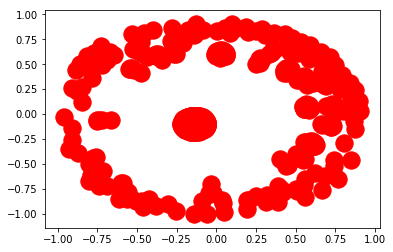

In [143]:
nx.draw_networkx(H, with_labels=False)
plt.show()

In [19]:
nx.number_connected_components(G)

858

In [20]:
components = nx.connected_components(G)
complist = list(components)

In [41]:
#calculate the number of components with several grants
def countSimpleComponents(complist):
    nonsimplelist = list() #stores the components with several grants
    for component in complist:
        counter = 0
        for entity in component:
            if 'grant' in entity:
                counter = counter + 1
        if counter > 1:
            nonsimplelist.append(component)
    print len(nonsimplelist)

In [42]:
countSimpleComponents(complist)

126


In [239]:
#translate list into dictionary for further indexed access
compdict = dict()
for index, component in enumerate(complist):
    compdict[index] = component
compdict

{0: {'entityid_02a46fefc2a788b9b16b68318ad73bcd',
  'entityid_06e6a1d38e093b70e56f7164ead73e88',
  'entityid_08042f4c63c5dffd06a198a282004252',
  'entityid_09488639309d2c382eddb6b739202819',
  'entityid_14777248ea8bd00cdd96a389d5ad4fd3',
  'entityid_19abe44e2d74eb93ad8c7a5ab2a0bbb2',
  'entityid_1e7622452f90495d59486aa5211b0bc1',
  'entityid_20f609e54055bf2e1e8f5897af44032e',
  'entityid_22382477b91e32a77dc5af09a8a7f769',
  'entityid_225b72ad32ca57c9cda2c6779e21b5c0',
  'entityid_26bd1f219992220e01e152d7d7a5436b',
  'entityid_28041950796a51ddb4de5cb004a52a86',
  'entityid_29a89ec64850ac99b676a998111bfacb',
  'entityid_2a393e85a210ffa2b53426d78ecb1767',
  'entityid_2f78ecf9d8d4645ad37335e13074b5b7',
  'entityid_2fd8e5c4e0404d3adbe160929604c826',
  'entityid_31ae6c8de03e11e9b5b5e10a04b381fd',
  'entityid_3469eea53f9193e34581a30e6649ec04',
  'entityid_34b2164b4b42e6a53e38a6ed55234287',
  'entityid_3ac6408202e1ff509da9a5a97f9d0ed2',
  'entityid_3b3a4803a7e5eb5e7fd1639ea010d573',
  'entityi

In [209]:
betwCent = nx.betweenness_centrality(G)

In [193]:
subbetwCent = nx.betweenness_centrality(H)

In [194]:
subbetwCent

{'entityid_a108fad6eb07571deab494d72419c667': 0.0,
 'entityid_70b740a4f587ae67d65ae7cf95e3419c': 0.0,
 'grantnumber_fd8391a1e59bc3d23f78405422a879f4': 1.0570824524312896e-06,
 'entityid_1890de4532acedfba7e0edd422a34bdf': 0.0,
 'entityid_9861aea78199cdd8fbc2807ce18670c6': 0.0,
 'entityid_d23fd7db2b14408667bba4f4abf18c8f': 0.0,
 'entityid_db09c96b4a661466b6b237ca6a87b611': 0.0,
 'grantnumber_476dedd9e50aa92ef672a6b9c869925e': 3.1712473572938687e-06,
 'entityid_d5098179f747c2f3f34c285b26cc46a1': 0.0,
 'entityid_11de1b0125f2fcaa28e307a89db856c3': 0.0,
 'entityid_b77bfca6725a66082afc4d57f25eb812': 0.0,
 'entityid_125911d6f9c5f1ac8db13608011ccc1f': 0.0,
 'entityid_540d33f27e1728ebced5d1537b3e13b3': 0.0,
 'grantnumber_e943d9eda208ff0cba970099eb8c5701': 0.0,
 'entityid_c543549f4f389bdf7479f6bba2e0b006': 0.0,
 'entityid_c5a5b098b8b3692e8110cf4c8b3ff77c': 0.0,
 'entityid_a95d3e3abb94e1904fccf1582419413f': 0.0,
 'entityid_0b6a68c9e6809d65e03540a468e261c8': 0.0,
 'entityid_76b5c24e6b0747436b917052

In [210]:
pickle_out = open("betwCent.pickle","wb")
pickle.dump(betwCent, pickle_out)
pickle_out.close()

In [211]:
pickle_in = open("betwCent.pickle","rb")
betwCent = pickle.load(pickle_in)
betwCent

{'entityid_85f34b776b3f788e4f63015863b1603c': 0.0,
 'entityid_ebad3c3ee67f7c5310bec0cc919fcb4f': 0.0,
 'entityid_61a9a1ab8369e8daec543447c49fbb2f': 0.0,
 'entityid_fd8d0742d0baf0cc188c57b5fb145cd8': 0.0,
 'entityid_e346ae5422f52453a7261b069d33c347': 0.0,
 'entityid_3ac13801f810b722febfb535b13478e1': 0.0,
 'entityid_b6462d884c5c70a62f0843e2ef51ba4b': 0.0,
 'entityid_de326287d3510e8f3e888fa4952652e8': 0.0,
 'entityid_092ef612b821bd7667bd51a478d7b037': 0.0,
 'entityid_562c46fc04916595517f9a2b21ddbacf': 0.0,
 'entityid_caa817aeb1031d777aad84f17d085754': 0.0,
 'entityid_7b1357118f9b50954744a6b995894e0c': 0.0,
 'entityid_efeca8f42de187411a5a01a0271d2e34': 0.0,
 'entityid_3981e6c01f819ce3bf8b3d237fe3867f': 2.3525024880328606e-08,
 'entityid_bd52bcad54f9717c550ea1b7c7dee755': 4.0385175951644104e-08,
 'entityid_26c6cc3f13efeda1405558e9d5aa6af0': 0.0,
 'entityid_ac27c2d14cc3902de8b84814886a9715': 0.0,
 'entityid_4deccbb33ee7d0b39151e8c0bf2e08ba': 0.0,
 'entityid_0ad6a2c39d69df854a3b18ee4029e33a'

In [96]:
betwCent['entityid_3981e6c01f819ce3bf8b3d237fe3867f']

2.352938328330074e-08

In [217]:
#complist is a list of lists, complist[0] - is a list of components
df = pd.DataFrame(complist)
for index, row in df.iterrows():
    df.at[index,0] = index
    df.at[index,1] = complist[index]
    df.at[index,2] = len(complist[index])
    df.at[index,3] = getAvgBetwCent(complist[index], betwCent)
    df.at[index,4] = len(getTypeList(complist[index]))
    df.at[index,5] = getDiversity(complist[index])
#df.at[0,0] = complist[0]
#f

129.0
129.0
Engagement Activities
4.6511627907
Collaborators
6.2015503876
Influence on Policy
0.77519379845
Grant
4.6511627907
Collaborations and Partnerships
6.2015503876
Next Destination
2.32558139535
Publications
63.5658914729
Awards and Recognition
6.97674418605
Further Funding
3.1007751938
Research Tools & Methods
1.5503875969
4227.51036596
1823.0
1823.0
Products, interventions and clinical trials
0.0548546352167
Engagement Activities
3.23642347778
Collaborators
11.6840373012
Influence on Policy
0.713110257817
Collaborations and Partnerships
11.6840373012
Artistic & Creative Products
0.383982446517
Grant
0.548546352167
Other Outputs & Knowledge / Future Steps
2.19418540867
Use of Facilities & Resources
0.109709270433
Next Destination
1.09709270433
Research Databases & Models
0.16456390565
Publications
53.428414701
Spin Outs
0.0548546352167
Awards and Recognition
8.06363137685
Research Tools & Methods
2.08447613823
Further Funding
4.44322545255
Software & Technical Products
0.05485

37.0
37.0
Engagement Activities
8.10810810811
Collaborators
8.10810810811
Influence on Policy
8.10810810811
Grant
5.40540540541
Collaborations and Partnerships
8.10810810811
Other Outputs & Knowledge / Future Steps
13.5135135135
Next Destination
8.10810810811
Publications
16.2162162162
Awards and Recognition
10.8108108108
Research Tools & Methods
10.8108108108
Further Funding
2.7027027027
1044.55807159
33.0
33.0
Engagement Activities
9.09090909091
Publications
84.8484848485
Intellectual Property & Licensing
3.0303030303
Grant
3.0303030303
7300.27548209
2.0
2.0
Other Outputs & Knowledge / Future Steps
50.0
Grant
50.0
5000.0
7.0
7.0
Collaborators
14.2857142857
Use of Facilities & Resources
14.2857142857
Grant
14.2857142857
Further Funding
42.8571428571
Collaborations and Partnerships
14.2857142857
2653.06122449
15.0
15.0
Collaborators
13.3333333333
Grant
13.3333333333
Collaborations and Partnerships
13.3333333333
Publications
40.0
Further Funding
13.3333333333
Research Tools & Methods
6.

38.0
38.0
Products, interventions and clinical trials
5.26315789474
Engagement Activities
10.5263157895
Collaborators
13.1578947368
Influence on Policy
5.26315789474
Grant
2.63157894737
Collaborations and Partnerships
13.1578947368
Other Outputs & Knowledge / Future Steps
7.89473684211
Next Destination
2.63157894737
Publications
10.5263157895
Research Databases & Models
5.26315789474
Awards and Recognition
5.26315789474
Further Funding
7.89473684211
Research Tools & Methods
2.63157894737
Software & Technical Products
7.89473684211
886.426592798
35.0
35.0
Other Outputs & Knowledge / Future Steps
2.85714285714
Publications
94.2857142857
Grant
2.85714285714
8906.12244898
33.0
33.0
Collaborators
3.0303030303
Collaborations and Partnerships
9.09090909091
Grant
3.0303030303
Publications
54.5454545455
Awards and Recognition
27.2727272727
Further Funding
3.0303030303
3829.20110193
27.0
27.0
Collaborators
7.40740740741
Collaborations and Partnerships
7.40740740741
Grant
3.7037037037
Other Outpu

50.0
50.0
Engagement Activities
12.0
Collaborators
2.0
Influence on Policy
2.0
Collaborations and Partnerships
2.0
Grant
2.0
Research Databases & Models
2.0
Publications
58.0
Awards and Recognition
2.0
Research Tools & Methods
2.0
Further Funding
16.0
3792.0
8.0
8.0
Products, interventions and clinical trials
12.5
Collaborators
12.5
Grant
12.5
Collaborations and Partnerships
12.5
Intellectual Property & Licensing
12.5
Other Outputs & Knowledge / Future Steps
12.5
Research Tools & Methods
12.5
Further Funding
12.5
1250.0
72.0
72.0
Engagement Activities
1.38888888889
Collaborators
4.16666666667
Influence on Policy
9.72222222222
Grant
1.38888888889
Collaborations and Partnerships
4.16666666667
Publications
41.6666666667
Spin Outs
1.38888888889
Awards and Recognition
33.3333333333
Further Funding
2.77777777778
2989.9691358
10.0
10.0
Next Destination
30.0
Publications
40.0
Other Outputs & Knowledge / Future Steps
20.0
Grant
10.0
3000.0
5.0
5.0
Collaborators
40.0
Grant
20.0
Collaborations an

Next Destination
8.54700854701
Publications
71.7948717949
Further Funding
4.2735042735
5308.64197531
10.0
10.0
Collaborators
10.0
Collaborations and Partnerships
20.0
Grant
10.0
Next Destination
10.0
Publications
30.0
Awards and Recognition
10.0
Further Funding
10.0
1800.0
11.0
11.0
Publications
90.9090909091
Grant
9.09090909091
8347.10743802
18.0
18.0
Engagement Activities
27.7777777778
Collaborators
11.1111111111
Influence on Policy
5.55555555556
Grant
5.55555555556
Collaborations and Partnerships
11.1111111111
Next Destination
5.55555555556
Publications
27.7777777778
Further Funding
5.55555555556
1913.58024691
5.0
5.0
Engagement Activities
80.0
Grant
20.0
6800.0
12.0
12.0
Engagement Activities
25.0
Next Destination
8.33333333333
Publications
41.6666666667
Further Funding
8.33333333333
Grant
16.6666666667
2777.77777778
34.0
34.0
Publications
97.0588235294
Grant
2.94117647059
9429.06574394
9.0
9.0
Publications
77.7777777778
Grant
22.2222222222
6543.20987654
27.0
27.0
Engagement Activi

3.8961038961
1607.35368528
12.0
12.0
Collaborators
41.6666666667
Collaborations and Partnerships
41.6666666667
Further Funding
8.33333333333
Grant
8.33333333333
3611.11111111
58.0
58.0
Engagement Activities
36.2068965517
Collaborators
20.6896551724
Collaborations and Partnerships
20.6896551724
Grant
1.72413793103
Other Outputs & Knowledge / Future Steps
6.89655172414
Next Destination
1.72413793103
Publications
6.89655172414
Research Tools & Methods
5.1724137931
2294.88703924
3.0
3.0
Publications
66.6666666667
Grant
33.3333333333
5555.55555556
12.0
12.0
Publications
91.6666666667
Grant
8.33333333333
8472.22222222
36.0
36.0
Engagement Activities
41.6666666667
Collaborators
8.33333333333
Grant
2.77777777778
Collaborations and Partnerships
8.33333333333
Publications
19.4444444444
Awards and Recognition
13.8888888889
Further Funding
5.55555555556
2484.56790123
22.0
22.0
Collaborators
13.6363636364
Grant
4.54545454545
Collaborations and Partnerships
13.6363636364
Next Destination
4.545454545

3.77358490566
Further Funding
11.320754717
2687.78924884
25.0
25.0
Engagement Activities
8.0
Collaborators
8.0
Collaborations and Partnerships
8.0
Grant
8.0
Research Databases & Models
4.0
Publications
24.0
Awards and Recognition
12.0
Further Funding
20.0
Research Tools & Methods
8.0
1456.0
29.0
29.0
Collaborators
6.89655172414
Grant
10.3448275862
Collaborations and Partnerships
6.89655172414
Next Destination
3.44827586207
Publications
62.0689655172
Spin Outs
3.44827586207
Further Funding
6.89655172414
4126.04042806
12.0
12.0
Collaborators
8.33333333333
Collaborations and Partnerships
8.33333333333
Grant
8.33333333333
Intellectual Property & Licensing
8.33333333333
Next Destination
8.33333333333
Publications
50.0
Further Funding
8.33333333333
2916.66666667
24.0
24.0
Other Outputs & Knowledge / Future Steps
8.33333333333
Next Destination
4.16666666667
Publications
70.8333333333
Research Tools & Methods
4.16666666667
Grant
12.5
5277.77777778
30.0
30.0
Engagement Activities
6.66666666667


16.0
Intellectual Property & Licensing
18.75
Further Funding
37.5
Publications
31.25
Spin Outs
6.25
Grant
6.25
2812.5
6.0
6.0
Products, interventions and clinical trials
16.6666666667
Engagement Activities
16.6666666667
Grant
16.6666666667
Research Tools & Methods
16.6666666667
Spin Outs
16.6666666667
Further Funding
16.6666666667
1666.66666667
37.0
37.0
Engagement Activities
40.5405405405
Collaborators
8.10810810811
Collaborations and Partnerships
8.10810810811
Next Destination
2.7027027027
Intellectual Property & Licensing
27.027027027
Other Outputs & Knowledge / Future Steps
2.7027027027
Publications
2.7027027027
Awards and Recognition
2.7027027027
Grant
2.7027027027
Further Funding
2.7027027027
2549.30606282
11.0
11.0
Engagement Activities
54.5454545455
Awards and Recognition
9.09090909091
Next Destination
9.09090909091
Research Tools & Methods
9.09090909091
Grant
18.1818181818
3553.71900826
6.0
6.0
Publications
50.0
Further Funding
33.3333333333
Grant
16.6666666667
3888.88888889
1

4.16666666667
Next Destination
8.33333333333
Publications
12.5
Further Funding
12.5
Research Tools & Methods
4.16666666667
1215.27777778
6.0
6.0
Collaborators
16.6666666667
Collaborations and Partnerships
16.6666666667
Grant
16.6666666667
Other Outputs & Knowledge / Future Steps
16.6666666667
Publications
16.6666666667
Research Tools & Methods
16.6666666667
1666.66666667
15.0
15.0
Engagement Activities
20.0
Collaborators
6.66666666667
Grant
6.66666666667
Collaborations and Partnerships
6.66666666667
Publications
53.3333333333
Software & Technical Products
6.66666666667
3422.22222222
8.0
8.0
Products, interventions and clinical trials
12.5
Collaborators
12.5
Grant
12.5
Collaborations and Partnerships
12.5
Other Outputs & Knowledge / Future Steps
12.5
Further Funding
12.5
Awards and Recognition
12.5
Research Tools & Methods
12.5
1250.0
34.0
34.0
Other Outputs & Knowledge / Future Steps
5.88235294118
Publications
88.2352941176
Grant
5.88235294118
7854.67128028
13.0
13.0
Engagement Activit

39.0
39.0
Products, interventions and clinical trials
5.12820512821
Collaborators
7.69230769231
Influence on Policy
2.5641025641
Grant
2.5641025641
Collaborations and Partnerships
7.69230769231
Publications
41.0256410256
Awards and Recognition
15.3846153846
Further Funding
12.8205128205
Research Tools & Methods
5.12820512821
2268.24457594
4.0
4.0
Publications
75.0
Grant
25.0
6250.0
5.0
5.0
Products, interventions and clinical trials
20.0
Awards and Recognition
20.0
Research Databases & Models
20.0
Further Funding
20.0
Grant
20.0
2000.0
2.0
2.0
Publications
50.0
Grant
50.0
5000.0
14.0
14.0
Engagement Activities
7.14285714286
Collaborators
28.5714285714
Collaborations and Partnerships
28.5714285714
Grant
7.14285714286
Other Outputs & Knowledge / Future Steps
14.2857142857
Publications
14.2857142857
2142.85714286
7.0
7.0
Collaborators
14.2857142857
Collaborations and Partnerships
14.2857142857
Grant
14.2857142857
Other Outputs & Knowledge / Future Steps
14.2857142857
Use of Facilities & R

Grant
25.0
Collaborations and Partnerships
25.0
2500.0
7.0
7.0
Collaborators
14.2857142857
Grant
14.2857142857
Publications
28.5714285714
Further Funding
28.5714285714
Collaborations and Partnerships
14.2857142857
2244.89795918
11.0
11.0
Publications
63.6363636364
Further Funding
18.1818181818
Grant
18.1818181818
4710.74380165
8.0
8.0
Collaborators
12.5
Collaborations and Partnerships
12.5
Grant
12.5
Other Outputs & Knowledge / Future Steps
12.5
Publications
12.5
Further Funding
12.5
Research Tools & Methods
25.0
1562.5
25.0
25.0
Engagement Activities
4.0
Collaborators
16.0
Grant
4.0
Collaborations and Partnerships
16.0
Use of Facilities & Resources
8.0
Other Outputs & Knowledge / Future Steps
8.0
Next Destination
8.0
Further Funding
4.0
Awards and Recognition
8.0
Research Tools & Methods
8.0
Publications
16.0
1136.0
7.0
7.0
Engagement Activities
28.5714285714
Collaborators
14.2857142857
Grant
14.2857142857
Collaborations and Partnerships
14.2857142857
Intellectual Property & Licensing

5.0
5.0
Engagement Activities
20.0
Artistic & Creative Products
20.0
Publications
40.0
Grant
20.0
2800.0
12.0
12.0
Collaborators
8.33333333333
Grant
8.33333333333
Collaborations and Partnerships
8.33333333333
Other Outputs & Knowledge / Future Steps
8.33333333333
Publications
50.0
Research Tools & Methods
8.33333333333
Further Funding
8.33333333333
2916.66666667
6.0
6.0
Publications
50.0
Further Funding
16.6666666667
Grant
33.3333333333
3888.88888889
15.0
15.0
Other Outputs & Knowledge / Future Steps
13.3333333333
Publications
80.0
Grant
6.66666666667
6622.22222222
8.0
8.0
Grant
12.5
Other Outputs & Knowledge / Future Steps
12.5
Next Destination
12.5
Publications
25.0
Awards and Recognition
25.0
Further Funding
12.5
1875.0
4.0
4.0
Awards and Recognition
25.0
Research Tools & Methods
50.0
Grant
25.0
3750.0
9.0
9.0
Collaborators
11.1111111111
Collaborations and Partnerships
11.1111111111
Grant
11.1111111111
Research Databases & Models
11.1111111111
Further Funding
44.4444444444
Research 

9.0
9.0
Publications
33.3333333333
Collaborators
11.1111111111
Collaborations and Partnerships
11.1111111111
Artistic & Creative Products
33.3333333333
Grant
11.1111111111
2592.59259259
3.0
3.0
Publications
66.6666666667
Grant
33.3333333333
5555.55555556
3.0
3.0
Awards and Recognition
33.3333333333
Publications
33.3333333333
Grant
33.3333333333
3333.33333333
5.0
5.0
Other Outputs & Knowledge / Future Steps
20.0
Next Destination
20.0
Research Tools & Methods
20.0
Spin Outs
20.0
Grant
20.0
2000.0
3.0
3.0
Other Outputs & Knowledge / Future Steps
33.3333333333
Further Funding
33.3333333333
Grant
33.3333333333
3333.33333333
3.0
3.0
Other Outputs & Knowledge / Future Steps
33.3333333333
Further Funding
33.3333333333
Grant
33.3333333333
3333.33333333
15.0
15.0
Engagement Activities
40.0
Collaborators
6.66666666667
Grant
13.3333333333
Collaborations and Partnerships
6.66666666667
Other Outputs & Knowledge / Future Steps
13.3333333333
Publications
13.3333333333
Further Funding
6.66666666667
226

2.0
2.0
Publications
50.0
Grant
50.0
5000.0
2.0
2.0
Other Outputs & Knowledge / Future Steps
50.0
Grant
50.0
5000.0
2.0
2.0
Other Outputs & Knowledge / Future Steps
50.0
Grant
50.0
5000.0
2.0
2.0
Further Funding
50.0
Grant
50.0
5000.0
2.0
2.0
Publications
50.0
Grant
50.0
5000.0
3.0
3.0
Other Outputs & Knowledge / Future Steps
33.3333333333
Influence on Policy
33.3333333333
Grant
33.3333333333
3333.33333333
4.0
4.0
Other Outputs & Knowledge / Future Steps
25.0
Use of Facilities & Resources
50.0
Grant
25.0
3750.0
2.0
2.0
Publications
50.0
Grant
50.0
5000.0
2.0
2.0
Further Funding
50.0
Grant
50.0
5000.0


In [218]:
df

,0,1,2,3,4,5,6,7,8,9,...,2636,2637,2638,2639,2640,2641,2642,2643,2644,2645
0,0,"{entityid_d18a3f616a97516446130f339f974cdd, en...",129,7.03109e-07,10,0.613327,entityid_77956e9103ea2a310260b971ca158700,entityid_4114ea4a5e1fe857d5958adc228b77a3,entityid_d2b9986afeb86ec9a334b1a3716ed197,entityid_b98d834524f68a54fb8d9a569883b329,...,None,None,None,None,None,None,None,None,None,None
1,1,"{entityid_33ed844492abd4db22a0b3c7cc597bdf, en...",1823,1.16053e-05,17,0.718862,entityid_3e40301f60756c856d9c8865fb35fecd,entityid_82c525bdef903e39231fd206bc93b0a3,entityid_eded85ad4cad63d1719541f434df1d75,entityid_70c6ab074254fa5bdb6fd10420a88108,...,None,None,None,None,None,None,None,None,None,None
2,2,"{entityid_c3241621f6aa3ae12f66b7302106f4a7, en...",266,5.64056e-07,10,0.783886,entityid_5705f57eeecdbff397d0f6f5c626e9fa,entityid_291a2fc88ce8dd80fbd3290c730680ab,entityid_c7643bee096cbce719301a3ac0242630,entityid_93a61357ed23b4cc7a7a8aae543b5d54,...,None,None,None,None,None,None,None,None,None,None
3,3,"{entityid_4adfd3220f9991493bc32752cc1ab4d4, en...",27,5.16302e-08,9,0.524691,grantnumber_b2a3b176f9e84fb107002db98d2cbf78,entityid_eb3eeff1bc88cd08b9399d260881f178,entityid_900e743bc1c6ea78bebcf44b30dbc917,entityid_4086ab5a9c370b0b82bdd7c3c1f0a827,...,None,None,None,None,None,None,None,None,None,None
4,4,"{entityid_1cf9f8a307e80ebd06ed459f6ede56ac, en...",41,8.16008e-08,12,0.932927,entityid_ee1d7f2dcd86bfdec10fe72c7bcdceb3,entityid_df774fdae853ec3f46a32fc012fdba41,entityid_f41dbca6c900db7574fa6b7a19cfda12,entityid_2f3b244b165f65e0ee5713082b1b22b6,...,None,None,None,None,None,None,None,None,None,None
5,5,"{entityid_d33951c3764ba97541681ebfaea20a76, en...",153,3.76167e-07,8,0.430192,entityid_3f22a478dcba6a63d501dde1d24adf6e,entityid_5c6184975e5f8edc6f6c9a1135327068,entityid_aef86485df1192618ba88d347ae22593,entityid_b697665ea78c519b58491acd23536be8,...,None,None,None,None,None,None,None,None,None,None
6,6,"{entityid_a1d277638c7618f2437586c76dbabf46, en...",95,1.97352e-07,11,0.42759,entityid_078007dcc6ad7e17631b467130a26948,entityid_8596bb804d049f02c8636006b838e131,entityid_874890f24fd01abb5f259933741de140,entityid_693a53ca0464987f1d442ce26c4d2da9,...,None,None,None,None,None,None,None,None,None,None
7,7,"{entityid_104ac0bc2859981afa75586e2d70cf37, en...",7,9.1913e-09,3,0.477041,entityid_21315bf2cbf2f48b074b3864d3f2b956,None,None,None,...,None,None,None,None,None,None,None,None,None,None
8,8,"{entityid_5b5f16af34c736b02ad632c3d998cd79, en...",10,1.54414e-08,5,0.8075,entityid_d7e5c95888136a6419ab8161ebe32d6b,entityid_9fd7c95b8e9dcc6322f273d020902304,grantnumber_4d8a618a7b272663a3d43362e9ff8ef8,entityid_bb06617d6fb8e108cddaf1bcdb905910,...,None,None,None,None,None,None,None,None,None,None
9,9,"{entityid_91a90f66b6b0b752b3a41176404be9cc, en...",105,2.18794e-07,7,0.837664,entityid_b1f38297002ffb97f18bc329653d4610,entityid_7fd8d7eb4722999f0831522a435c703c,entityid_d34ce43069291aa3e7a24e10577ebebe,entityid_d4ea9efc7c1d160e80836daf3afc6558,...,None,None,None,None,None,None,None,None,None,None


In [260]:
def getAvgBetwCent(arg1, inputbetwCent):
    sum = 0
    avg = 0
    for entity in arg1:
        sum = sum + inputbetwCent[entity]
    if len(arg1)>0:
        avg = sum / len(arg1)
    return avg;

In [184]:
def getTypeList(component):
    entTypeList = list()
    for entity in component:
        enttype = getEntityType(entity)
        if enttype not in entTypeList:
            entTypeList.append(enttype)
    #print entTypeList
    result = entTypeList
    #print result
    return result;

In [185]:
def getEntityType(entity):
    #G.node['entity_Name']['attribute']
    result = G.node[entity]['type']
    #print result
    return result;

In [466]:
getEntityType('entityid_a1d277638c7618f2437586c76dbabf46')

'Publications'

In [186]:
def getEntityYear(entity):
    #G.node['entity_Name']['attribute']
    result = G.node[entity]['year']
    #print result
    return result;

In [187]:
def getDiversity(component):
    percperType = calcPctperType(component) #returns dict in the form of "type:percentage"
    sumSq = calcSumSquare(component) #returns sum of squares
    iqv = calcIQV(17,sumSq)#TODO automate K-parameter
    return iqv;

In [188]:
def getTypeDict(component): #returns dictionary in the form of "type:occurences" per component
    entTypeDict = dict()
    for entity in component:
        entTypeDict = addtoTypeDict(entity, entTypeDict)
    #print entTypeList
    return entTypeDict;

In [189]:
def addtoTypeDict(entity, entTypeDict): #takes entity, adds the number of occurences for type of this entity to the general dictionary of types
    enttype = getEntityType(entity)
    if enttype not in entTypeDict:
        entTypeDict[enttype] = 1
    else:
        entTypeDict[enttype] = entTypeDict[enttype] + 1
    return entTypeDict;

In [274]:
#takes component, returns a dictionary in form of type:percentage
#slightly differs from SNA.xls, because in excel, grants were subtracted from the percentage - here we dont subtract
def calcPctperType(component): 
    typeOccurDict = getTypeDict(component)
    typePctDict = dict()
    #find sum of occurences
    sum = 0.0
    for row in typeOccurDict:
        sum = sum + typeOccurDict[row]
    #print sum
    for row in typeOccurDict:
        #print row
        #print "occurences:" + str(typeOccurDict[row])
        typePctDict[row] = 100*typeOccurDict[row]/sum
        #print "pcts:" + str(typePctDict[row])
    return typePctDict;

In [275]:
def calcSumSquare(component): #returns a sum of squares for type occurence percentages for each component
    sumSqDict = dict()
    pctperType = calcPctperType(component)
    sumSQ = 0.0
    for row in pctperType:
        sumSQ = sumSQ + pctperType[row]*pctperType[row]
        sumSqDict[row] = sumSQ
        #print row
        #print pctperType[row]
    #print sumSQ
    return sumSQ;

In [174]:
G.node['entityid_e9e5a81a11978a59366056e5cf6bdbda']['type']

'Collaborators'

In [197]:
def calcIQV(k, sumSQ):
    iqv = k * (10000 - sumSQ)/(10000*(k-1))
    return iqv;

In [193]:
addTypeDict('entityid_e9e5a81a11978a59366056e5cf6bdbda')

{'Collaborators': 1}

In [203]:
getTypeDict(complist[1])

{nan: 10,
 'Artistic & Creative Products': 7,
 'Awards and Recognition': 147,
 'Collaborations and Partnerships': 213,
 'Collaborators': 213,
 'Engagement Activities': 59,
 'Further Funding': 81,
 'Influence on Policy': 13,
 'Next Destination': 20,
 'Other Outputs & Knowledge / Future Steps': 40,
 'Products, interventions and clinical trials': 1,
 'Publications': 974,
 'Research Databases & Models': 3,
 'Research Tools & Methods': 38,
 'Software & Technical Products': 1,
 'Spin Outs': 1,
 'Use of Facilities & Resources': 2}

In [253]:
calcPctperType(complist[1])

1823.0


{nan: 0.5485463521667581,
 'Artistic & Creative Products': 0.3839824465167307,
 'Awards and Recognition': 8.063631376851344,
 'Collaborations and Partnerships': 11.684037301151948,
 'Collaborators': 11.684037301151948,
 'Engagement Activities': 3.2364234777838727,
 'Further Funding': 4.443225452550741,
 'Influence on Policy': 0.7131102578167855,
 'Next Destination': 1.0970927043335161,
 'Other Outputs & Knowledge / Future Steps': 2.1941854086670323,
 'Products, interventions and clinical trials': 0.05485463521667581,
 'Publications': 53.428414701042236,
 'Research Databases & Models': 0.16456390565002743,
 'Research Tools & Methods': 2.084476138233681,
 'Software & Technical Products': 0.05485463521667581,
 'Spin Outs': 0.05485463521667581,
 'Use of Facilities & Resources': 0.10970927043335162}

In [254]:
calcSumSquare(complist[3])

41.0
nan
2.43902439024
Engagement Activities
12.1951219512
Collaborators
17.0731707317
Influence on Policy
4.87804878049
Collaborations and Partnerships
17.0731707317
Artistic & Creative Products
2.43902439024
Next Destination
14.6341463415
Research Databases & Models
2.43902439024
Software & Technical Products
7.31707317073
Awards and Recognition
12.1951219512
Further Funding
2.43902439024
Publications
4.87804878049
1219.51219512


1219.5121951219512

In [262]:
getDiversity(complist[1])

1823.0
1823.0
nan
0.548546352167
Engagement Activities
3.23642347778
Collaborators
11.6840373012
Influence on Policy
0.713110257817
Collaborations and Partnerships
11.6840373012
Products, interventions and clinical trials
0.0548546352167
Artistic & Creative Products
0.383982446517
Other Outputs & Knowledge / Future Steps
2.19418540867
Use of Facilities & Resources
0.109709270433
Next Destination
1.09709270433
Research Databases & Models
0.16456390565
Publications
53.428414701
Spin Outs
0.0548546352167
Awards and Recognition
8.06363137685
Research Tools & Methods
2.08447613823
Further Funding
4.44322545255
Software & Technical Products
0.0548546352167
3234.23591224


0.7188624343241371

In [282]:
#first creates a subgraph for a given year, then returns the betweenness centrality for that year
def getBetwCent(year):
    Y = getSubGraph(year)
    yearbetwcent = nx.betweenness_centrality(Y)
    print year
    print yearbetwcent
    return yearbetwcent;

In [283]:
#calculates the list of betweenness centralities once for each, retrieved later
def getBetwCentDict(startyear, finishyear):
    betwcentdict = dict()
    for year in range(startyear, finishyear):
        yearbetwcent = getBetwCent(year)
        betwcentdict[year] = yearbetwcent
    return betwcentdict;

In [284]:
globalbetwcentdict = getBetwCentDict(2010,2018)

['entityid_b77bfca6725a66082afc4d57f25eb812', 'entityid_76b5c24e6b0747436b91705293eb53f9', 'entityid_734a9ec05b4ddae97bed660e2272b667', 'entityid_b0fbe31a9afeb20f66a87d78c24521f8', 'entityid_3bc0598e034600221c1337ef6628e867', 'entityid_b5a895f181bc3b716ee933ae9c9f986e', 'entityid_a28780d186126d48bc42fd3a5cca78ea', 'entityid_fa51442ffdea1ab4626b3cb0786ff236', 'entityid_14106b21d50768d1290ebdbbc66e0efd', 'entityid_db09c96b4a661466b6b237ca6a87b611', 'entityid_d5e67bbd5de972aea05a57213482ef9f', 'entityid_692cf7f4dcb2a021bc7d49f7bd095782', 'entityid_e9eb931dd86ba03a1d5e58e6beda4200', 'entityid_357872d913df8df12d304ee154dd87b6', 'entityid_2ecdd29eea92fcfd9ecc996c709f2e70', 'grantnumber_423a0017c4adb7daa4af161ad4394d79', 'entityid_e850f1c70b35810457bea547512c8598', 'entityid_8bcd8ca9d73690d0b195381bd28fa4c5', 'entityid_14694ee9467fe772b0225b826c811975', 'entityid_05a49fecf8f09286ee0277dbb0db18cb', 'entityid_b8cefb5fb467d37f79335a6b8b37a91c', 'entityid_8d2829d6a91eed3aa834dc0b16b7eb92', 'entit

2010
{'entityid_a108fad6eb07571deab494d72419c667': 0.0, 'entityid_3a96b2259beb73ca003f15b811bde0cb': 0.0, 'entityid_93d16393305869f6d818becf7f4772a2': 0.0, 'entityid_03500bfd8549fe7c687f09c4168da392': 0.0, 'entityid_46bbdc511cdcf4531c365220da1858aa': 0.0, 'entityid_62a331a7bd0bfbf14fcc78c6442ed30a': 0.0, 'entityid_698372f03a9b46a77135abf4a473fa74': 0.0, 'entityid_90c7b4606618645e92eb1180f77f53ff': 0.0, 'entityid_d84e0ef6665361dc64f5e14dd7dddb23': 0.0, 'entityid_246fdd78da7b865a6af26a8ea9e38948': 0.0, 'entityid_62e1893898355ab00702622b2e803ab1': 0.0, 'entityid_06127fa63292bd4142665038d694d645': 0.0, 'entityid_3ecf8d4242d5ef0df90b4321c79e22c2': 0.0, 'entityid_0a01cbd0cc7452f2bd581b0f7e2f77f6': 0.0, 'entityid_9861aea78199cdd8fbc2807ce18670c6': 0.0, 'entityid_5ff48c0c0764119450bd29c34b8578be': 0.0, 'entityid_31ae6c8de03e11e9b5b5e10a04b381fd': 0.0, 'entityid_d23fd7db2b14408667bba4f4abf18c8f': 0.0, 'entityid_5d4780d672154cdb484add27472c495c': 0.0, 'entityid_607d3ce318ba2c8211f6d8df2bbc3709':

2011
{'entityid_a108fad6eb07571deab494d72419c667': 0.0, 'entityid_70b740a4f587ae67d65ae7cf95e3419c': 0.0, 'grantnumber_fd8391a1e59bc3d23f78405422a879f4': 1.0570824524312896e-06, 'entityid_1890de4532acedfba7e0edd422a34bdf': 0.0, 'entityid_9861aea78199cdd8fbc2807ce18670c6': 0.0, 'entityid_d23fd7db2b14408667bba4f4abf18c8f': 0.0, 'entityid_db09c96b4a661466b6b237ca6a87b611': 0.0, 'grantnumber_476dedd9e50aa92ef672a6b9c869925e': 3.1712473572938687e-06, 'entityid_d5098179f747c2f3f34c285b26cc46a1': 0.0, 'entityid_11de1b0125f2fcaa28e307a89db856c3': 0.0, 'entityid_b77bfca6725a66082afc4d57f25eb812': 0.0, 'entityid_125911d6f9c5f1ac8db13608011ccc1f': 0.0, 'entityid_540d33f27e1728ebced5d1537b3e13b3': 0.0, 'grantnumber_e943d9eda208ff0cba970099eb8c5701': 0.0, 'entityid_c543549f4f389bdf7479f6bba2e0b006': 0.0, 'entityid_c5a5b098b8b3692e8110cf4c8b3ff77c': 0.0, 'entityid_a95d3e3abb94e1904fccf1582419413f': 0.0, 'entityid_0b6a68c9e6809d65e03540a468e261c8': 0.0, 'entityid_76b5c24e6b0747436b91705293eb53f9': 0.

2012
{'entityid_a108fad6eb07571deab494d72419c667': 0.0, 'entityid_3d1abe09639642447cde754cf062c240': 0.0, 'entityid_e9e5a81a11978a59366056e5cf6bdbda': 0.0, 'entityid_214fba3378abc6e88bd74393638e6712': 0.0, 'entityid_70b740a4f587ae67d65ae7cf95e3419c': 0.0, 'entityid_2a640df94c050b5a46d8268630ef14db': 0.0, 'grantnumber_fd8391a1e59bc3d23f78405422a879f4': 5.192908771497994e-07, 'entityid_1890de4532acedfba7e0edd422a34bdf': 0.0, 'entityid_9861aea78199cdd8fbc2807ce18670c6': 0.0, 'entityid_af162f9b88ec11c7623b7ecfcf519bcd': 0.0, 'entityid_d23fd7db2b14408667bba4f4abf18c8f': 0.0, 'entityid_6596414f5fc942c789183f91111e7baa': 0.0, 'entityid_9f37b97b2595a5ae496686dc01201180': 0.0, 'entityid_db09c96b4a661466b6b237ca6a87b611': 0.0, 'entityid_4055afc01b840ce76fd550439b384f57': 0.0, 'grantnumber_476dedd9e50aa92ef672a6b9c869925e': 1.557872631449398e-06, 'entityid_72e72da6e58041c1d5271c8089f718b0': 0.0, 'entityid_11de1b0125f2fcaa28e307a89db856c3': 0.0, 'entityid_b77bfca6725a66082afc4d57f25eb812': 0.0, 'e

2013
{'entityid_a108fad6eb07571deab494d72419c667': 0.0, 'entityid_3ee781a081990f0fb70389ec635a3abc': 0.0, 'entityid_58fd44107ecb2c2716d25d7f611c6a34': 0.0, 'entityid_b1c0618974c6d139019ffea7964566e3': 0.0, 'entityid_fee9046f65d3d9882f744c7a00515f76': 0.0, 'entityid_edbebe9d07a4abdcd2bb1560e1a5c1e5': 0.0, 'entityid_3883d74850f4aaa47b44bf43ee6e3893': 0.0, 'entityid_696e68f757721a54418d21d6155d11f0': 1.0902855556987245e-05, 'entityid_3d1abe09639642447cde754cf062c240': 0.0, 'entityid_870db879f04ba510db1621d20f003a05': 0.0, 'entityid_e9e5a81a11978a59366056e5cf6bdbda': 0.0, 'entityid_214fba3378abc6e88bd74393638e6712': 0.0, 'entityid_657cb72dd8cf1a2d7236c820dc5da068': 0.0, 'entityid_70b740a4f587ae67d65ae7cf95e3419c': 0.0, 'entityid_2a640df94c050b5a46d8268630ef14db': 0.0, 'grantnumber_fd8391a1e59bc3d23f78405422a879f4': 1.6519478116647338e-07, 'entityid_1890de4532acedfba7e0edd422a34bdf': 0.0, 'entityid_9861aea78199cdd8fbc2807ce18670c6': 0.0, 'entityid_af162f9b88ec11c7623b7ecfcf519bcd': 0.0, 'en

2014
{'entityid_1524a5e86c2daa4b9330962f726e5a98': 0.0, 'entityid_7b1357118f9b50954744a6b995894e0c': 0.0, 'entityid_efeca8f42de187411a5a01a0271d2e34': 0.0, 'entityid_ac27c2d14cc3902de8b84814886a9715': 0.0, 'entityid_4ce8ebad22cadb7cd42e824a4566b1cd': 0.0, 'entityid_e9e5a81a11978a59366056e5cf6bdbda': 0.0, 'grantnumber_fd8391a1e59bc3d23f78405422a879f4': 3.0755139323577056e-06, 'entityid_616bbed7144d70ff681606966ccdc670': 0.0, 'entityid_9ae3a735461ed5510881c7fe37289e3e': 0.0, 'entityid_d60858417ce285bd5bed07ee00a14652': 0.0, 'entityid_db09c96b4a661466b6b237ca6a87b611': 0.0, 'entityid_633bd51b4a089fdbecb0967847dbb482': 0.0, 'entityid_b77bfca6725a66082afc4d57f25eb812': 0.0, 'grantnumber_e943d9eda208ff0cba970099eb8c5701': 3.6346982836954705e-07, 'entityid_2623b70bb4ea9ac2d67c6c9f933241d8': 0.0, 'entityid_740d35ed7abb69365d570c2babde1a11': 0.0, 'entityid_3bc9b2e69d70632702f80c4ea5e67608': 0.0, 'entityid_37a40a3902ae200e3247d3a22e6c9261': 0.0, 'entityid_76b5c24e6b0747436b91705293eb53f9': 0.0, 

2015
{'entityid_fd8d0742d0baf0cc188c57b5fb145cd8': 0.0, 'entityid_b6462d884c5c70a62f0843e2ef51ba4b': 0.0, 'entityid_de326287d3510e8f3e888fa4952652e8': 0.0, 'entityid_1524a5e86c2daa4b9330962f726e5a98': 0.0, 'entityid_7b1357118f9b50954744a6b995894e0c': 0.0, 'entityid_efeca8f42de187411a5a01a0271d2e34': 0.0, 'entityid_3981e6c01f819ce3bf8b3d237fe3867f': 1.2898024772933365e-07, 'entityid_bd52bcad54f9717c550ea1b7c7dee755': 1.2056148264656565e-07, 'entityid_ac27c2d14cc3902de8b84814886a9715': 0.0, 'entityid_4ce8ebad22cadb7cd42e824a4566b1cd': 0.0, 'entityid_e306634b871250cbad28b9d08d05f34a': 0.0, 'entityid_e9e5a81a11978a59366056e5cf6bdbda': 0.0, 'entityid_2066473ec023fa122bb39a9a6d3054df': 0.0, 'entityid_6e4886145fdd8e0a4ce45f95026ae432': 0.0, 'entityid_691baf18bffc1529a5f2b640d5a69b9b': 3.6919193953307296e-07, 'entityid_45f3206998f6478a7ad2616c7021fdae': 0.0, 'grantnumber_fd8391a1e59bc3d23f78405422a879f4': 2.1197623322473084e-06, 'entityid_616bbed7144d70ff681606966ccdc670': 0.0, 'entityid_9ae3a

2016
{'entityid_85f34b776b3f788e4f63015863b1603c': 0.0, 'entityid_ebad3c3ee67f7c5310bec0cc919fcb4f': 0.0, 'entityid_fd8d0742d0baf0cc188c57b5fb145cd8': 0.0, 'entityid_e346ae5422f52453a7261b069d33c347': 0.0, 'entityid_b6462d884c5c70a62f0843e2ef51ba4b': 0.0, 'entityid_de326287d3510e8f3e888fa4952652e8': 0.0, 'entityid_092ef612b821bd7667bd51a478d7b037': 0.0, 'entityid_caa817aeb1031d777aad84f17d085754': 0.0, 'entityid_7b1357118f9b50954744a6b995894e0c': 0.0, 'entityid_efeca8f42de187411a5a01a0271d2e34': 0.0, 'entityid_3981e6c01f819ce3bf8b3d237fe3867f': 4.4000549599303514e-08, 'entityid_bd52bcad54f9717c550ea1b7c7dee755': 1.0522837728940555e-07, 'entityid_06741c60c53661acaea94d854770d66c': 0.0, 'entityid_ac27c2d14cc3902de8b84814886a9715': 0.0, 'entityid_4deccbb33ee7d0b39151e8c0bf2e08ba': 0.0, 'entityid_e306634b871250cbad28b9d08d05f34a': 0.0, 'entityid_de1a9964b1187c0ae93a42a34159e125': 0.0, 'entityid_2066473ec023fa122bb39a9a6d3054df': 0.0, 'entityid_6e4886145fdd8e0a4ce45f95026ae432': 0.0, 'entit

2017
{'entityid_85f34b776b3f788e4f63015863b1603c': 0.0, 'entityid_ebad3c3ee67f7c5310bec0cc919fcb4f': 0.0, 'entityid_61a9a1ab8369e8daec543447c49fbb2f': 0.0, 'entityid_fd8d0742d0baf0cc188c57b5fb145cd8': 0.0, 'entityid_e346ae5422f52453a7261b069d33c347': 0.0, 'entityid_3ac13801f810b722febfb535b13478e1': 0.0, 'entityid_b6462d884c5c70a62f0843e2ef51ba4b': 0.0, 'entityid_de326287d3510e8f3e888fa4952652e8': 0.0, 'entityid_092ef612b821bd7667bd51a478d7b037': 0.0, 'entityid_562c46fc04916595517f9a2b21ddbacf': 0.0, 'entityid_caa817aeb1031d777aad84f17d085754': 0.0, 'entityid_7b1357118f9b50954744a6b995894e0c': 0.0, 'entityid_efeca8f42de187411a5a01a0271d2e34': 0.0, 'entityid_3981e6c01f819ce3bf8b3d237fe3867f': 2.5974811908313133e-08, 'entityid_bd52bcad54f9717c550ea1b7c7dee755': 4.7149183789058065e-08, 'entityid_26c6cc3f13efeda1405558e9d5aa6af0': 0.0, 'entityid_ac27c2d14cc3902de8b84814886a9715': 0.0, 'entityid_4deccbb33ee7d0b39151e8c0bf2e08ba': 0.0, 'entityid_0ad6a2c39d69df854a3b18ee4029e33a': 0.0, 'entit

In [285]:
pickle_out = open("globalbetwcentdict.pickle","wb")
pickle.dump(globalbetwcentdict, pickle_out)
pickle_out.close()

In [288]:
globalbetwcentdict[2011]

{'entityid_a108fad6eb07571deab494d72419c667': 0.0,
 'entityid_70b740a4f587ae67d65ae7cf95e3419c': 0.0,
 'grantnumber_fd8391a1e59bc3d23f78405422a879f4': 1.0570824524312896e-06,
 'entityid_1890de4532acedfba7e0edd422a34bdf': 0.0,
 'entityid_9861aea78199cdd8fbc2807ce18670c6': 0.0,
 'entityid_d23fd7db2b14408667bba4f4abf18c8f': 0.0,
 'entityid_db09c96b4a661466b6b237ca6a87b611': 0.0,
 'grantnumber_476dedd9e50aa92ef672a6b9c869925e': 3.1712473572938687e-06,
 'entityid_d5098179f747c2f3f34c285b26cc46a1': 0.0,
 'entityid_11de1b0125f2fcaa28e307a89db856c3': 0.0,
 'entityid_b77bfca6725a66082afc4d57f25eb812': 0.0,
 'entityid_125911d6f9c5f1ac8db13608011ccc1f': 0.0,
 'entityid_540d33f27e1728ebced5d1537b3e13b3': 0.0,
 'grantnumber_e943d9eda208ff0cba970099eb8c5701': 0.0,
 'entityid_c543549f4f389bdf7479f6bba2e0b006': 0.0,
 'entityid_c5a5b098b8b3692e8110cf4c8b3ff77c': 0.0,
 'entityid_a95d3e3abb94e1904fccf1582419413f': 0.0,
 'entityid_0b6a68c9e6809d65e03540a468e261c8': 0.0,
 'entityid_76b5c24e6b0747436b917052

In [253]:
#function that takes list of components, and outputs another list of components, 
#where each component only has nodes with a year that is equal or earlier to the specified year
def getSubCompList(complist, year):
    outcomplist = list()
    for index, component in enumerate(complist):
        tempcomp = list()
        for entity in component:
            #if entity.year is less or equal to the specified year, put into resulting component
            if getEntityYear(entity) <= year:
                #put entity into component
                tempcomp.append(entity)
            #put new component into output component list
            #print index, tempcomp
        outcomplist.append(tempcomp)
    #print len(complist)
    #print outcomplist
    return outcomplist

0 ['entityid_5bf9030c831eccd3d97bcc46c39cf341', 'entityid_31ae6c8de03e11e9b5b5e10a04b381fd']


In [441]:
#function that takes a component list as an input and produces dataframe with components as rows and SNAs as columns
def getSNAdf (incomplist, inputbetwcent):
    subdf = pd.DataFrame(incomplist)
    for index, row in subdf.iterrows():
        subdf.at[index,0] = incomplist[index]
        subdf.at[index,1] = len(incomplist[index])
        subdf.at[index,2] = getAvgBetwCent(incomplist[index], inputbetwcent)
        subdf.at[index,3] = len(getTypeList(incomplist[index]))
        subdf.at[index,4] = getDiversity(incomplist[index])
        subdf.at[index,5] = getTypeList(incomplist[index])
    return subdf;

In [442]:
yeardf = getSNAdf(subcomplist, subbetwCent)
yeardf

KeyError: 'entityid_d18a3f616a97516446130f339f974cdd'

In [277]:
totaldf = getSNAdf(complist, betwCent)
totaldf

,0,1,2,3,4,5,6,7,8,9,...,2636,2637,2638,2639,2640,2641,2642,2643,2644,2645
0,"{entityid_d18a3f616a97516446130f339f974cdd, en...",129,7.03109e-07,10,0.613327,entityid_b2ce1d53cba5a79ea6afed2b2ac31107,entityid_77956e9103ea2a310260b971ca158700,entityid_4114ea4a5e1fe857d5958adc228b77a3,entityid_d2b9986afeb86ec9a334b1a3716ed197,entityid_b98d834524f68a54fb8d9a569883b329,...,None,None,None,None,None,None,None,None,None,None
1,"{entityid_33ed844492abd4db22a0b3c7cc597bdf, en...",1823,1.16053e-05,17,0.718862,entityid_4dfce042e8710a6ff9dfa7c373bae021,entityid_3e40301f60756c856d9c8865fb35fecd,entityid_82c525bdef903e39231fd206bc93b0a3,entityid_eded85ad4cad63d1719541f434df1d75,entityid_70c6ab074254fa5bdb6fd10420a88108,...,None,None,None,None,None,None,None,None,None,None
2,"{entityid_c3241621f6aa3ae12f66b7302106f4a7, en...",266,5.64056e-07,10,0.783886,entityid_d4aa7d3445c419c6d28f014d83570f75,entityid_5705f57eeecdbff397d0f6f5c626e9fa,entityid_291a2fc88ce8dd80fbd3290c730680ab,entityid_c7643bee096cbce719301a3ac0242630,entityid_93a61357ed23b4cc7a7a8aae543b5d54,...,None,None,None,None,None,None,None,None,None,None
3,"{entityid_4adfd3220f9991493bc32752cc1ab4d4, en...",27,5.16302e-08,9,0.524691,entityid_db56d78d54204314a7a0ec5bf7401736,grantnumber_b2a3b176f9e84fb107002db98d2cbf78,entityid_eb3eeff1bc88cd08b9399d260881f178,entityid_900e743bc1c6ea78bebcf44b30dbc917,entityid_4086ab5a9c370b0b82bdd7c3c1f0a827,...,None,None,None,None,None,None,None,None,None,None
4,"{entityid_1cf9f8a307e80ebd06ed459f6ede56ac, en...",41,8.16008e-08,12,0.932927,entityid_6532d308cf4e6433c4893fbab83d4f19,entityid_ee1d7f2dcd86bfdec10fe72c7bcdceb3,entityid_df774fdae853ec3f46a32fc012fdba41,entityid_f41dbca6c900db7574fa6b7a19cfda12,entityid_2f3b244b165f65e0ee5713082b1b22b6,...,None,None,None,None,None,None,None,None,None,None
5,"{entityid_d33951c3764ba97541681ebfaea20a76, en...",153,3.76167e-07,8,0.430192,entityid_b6462d884c5c70a62f0843e2ef51ba4b,entityid_3f22a478dcba6a63d501dde1d24adf6e,entityid_5c6184975e5f8edc6f6c9a1135327068,entityid_aef86485df1192618ba88d347ae22593,entityid_b697665ea78c519b58491acd23536be8,...,None,None,None,None,None,None,None,None,None,None
6,"{entityid_a1d277638c7618f2437586c76dbabf46, en...",95,1.97352e-07,11,0.42759,entityid_7325ac0b60a90a05df5ddcf4eda8deda,entityid_078007dcc6ad7e17631b467130a26948,entityid_8596bb804d049f02c8636006b838e131,entityid_874890f24fd01abb5f259933741de140,entityid_693a53ca0464987f1d442ce26c4d2da9,...,None,None,None,None,None,None,None,None,None,None
7,"{entityid_104ac0bc2859981afa75586e2d70cf37, en...",7,9.1913e-09,3,0.477041,entityid_d83941add4e2cc8dd1435ecd86f625ee,entityid_21315bf2cbf2f48b074b3864d3f2b956,None,None,None,...,None,None,None,None,None,None,None,None,None,None
8,"{entityid_5b5f16af34c736b02ad632c3d998cd79, en...",10,1.54414e-08,5,0.8075,entityid_562c46fc04916595517f9a2b21ddbacf,entityid_d7e5c95888136a6419ab8161ebe32d6b,entityid_9fd7c95b8e9dcc6322f273d020902304,grantnumber_4d8a618a7b272663a3d43362e9ff8ef8,entityid_bb06617d6fb8e108cddaf1bcdb905910,...,None,None,None,None,None,None,None,None,None,None
9,"{entityid_91a90f66b6b0b752b3a41176404be9cc, en...",105,2.18794e-07,7,0.837664,entityid_540a9750860b32727ee815015088b4f5,entityid_b1f38297002ffb97f18bc329653d4610,entityid_7fd8d7eb4722999f0831522a435c703c,entityid_d34ce43069291aa3e7a24e10577ebebe,entityid_d4ea9efc7c1d160e80836daf3afc6558,...,None,None,None,None,None,None,None,None,None,None


In [443]:
#get list of dataframes with SNA results for each year
def getSNAdfdict(start, finish):
    SNAdfdict = dict()
    for year in range(start, finish):
        yearcomplist = getSubCompList(complist, year)
        yearbetwcent = globalbetwcentdict[year]
        yearSNAdf = getSNAdf(yearcomplist, yearbetwcent)
        SNAdfdict[year] = yearSNAdf
    return SNAdfdict;

In [444]:
SNAdfdict = getSNAdfdict(2010,2018)
SNAdfdict[2014]

,0,1,2,3,4,5,6,7,8,9,...,773,774,775,776,777,778,779,780,781,782
0,"[entityid_4f3d9c3db22f21130752c92e34456fd4, en...",53,4.31099e-06,6,0.63697,"[Awards and Recognition, Publications, Grant, ...",entityid_87ad5be78751aab470cf8d8247f36a9b,entityid_9b88fb4bc10c16b946d0a865c3872b23,entityid_b54bf8ae416f9d8d13b79b87503c26ed,entityid_57cadba75bf96c80b6c4ae12a3b2ee6f,...,None,None,None,None,None,None,None,None,None,None
1,"[entityid_d23fd7db2b14408667bba4f4abf18c8f, en...",254,5.7279e-06,13,0.622388,"[Collaborators, Influence on Policy, Collabora...",entityid_e55dc935752b5c2b817869cdb8d186de,entityid_2595c802946ace9e6fa31056cd8cac78,entityid_68775632a8b5aad60f506098a411fbf4,entityid_d11421a19a8c7c92be781880931d8b9d,...,None,None,None,None,None,None,None,None,None,None
2,"[entityid_c3241621f6aa3ae12f66b7302106f4a7, en...",73,1.95791e-06,4,0.554677,"[Collaborators, Collaborations and Partnership...",entityid_2a95c7e3019c9ae97221935babf4aa1d,entityid_e075acbc2b4f49ed7dcb9ad761192ae0,entityid_11de1b0125f2fcaa28e307a89db856c3,entityid_6d532400ec8536b569ed74dc9b19e2ce,...,None,None,None,None,None,None,None,None,None,None
3,"[entityid_4adfd3220f9991493bc32752cc1ab4d4, gr...",8,1.46786e-07,8,0.929688,"[Further Funding, Grant, Collaborations and Pa...",entityid_8a21d09cc31b4b85163c50d3ecd0b97f,entityid_4fd27d0346ffeb4fcff873e0283de0ad,None,None,...,None,None,None,None,None,None,None,None,None,None
4,"[entityid_8daa306fc71073243ea128ec52664b8f, en...",16,3.66965e-07,5,0.697266,"[Next Destination, Collaborators, Research Dat...",entityid_14694ee9467fe772b0225b826c811975,entityid_3fbce8911821fa6adfb041a53391a966,entityid_6d194e052470d357e120c24f53b3d40c,entityid_e4faa783b0938d03ce8643fd5cd5ba59,...,None,None,None,None,None,None,None,None,None,None
5,"[entityid_d33951c3764ba97541681ebfaea20a76, en...",73,1.95638e-06,7,0.610504,"[Publications, Collaborators, Collaborations a...",entityid_cb9f406754d6d8f4e9bfe90c348b552b,entityid_5bd8313c29a27b414ccb55bf437b0f44,entityid_95ae7b16f46bbd259bb7b658c28d0bfa,entityid_79721fcdf33fa3b34c05042b70bf0c1a,...,None,None,None,None,None,None,None,None,None,None
6,"[entityid_7684c50d5906aa028f5f69482224e3fe, en...",60,1.59461e-06,11,0.506458,"[Publications, Research Databases & Models, Ne...",entityid_035c5d78c1d81a1fc8f28f02d03f8591,entityid_48b51182f806b6a8dbd7a602aaeeaf96,entityid_f25e02e8e7697119de8179c439978f2b,entityid_c905bb83514b6dce8ff53bbd140f2b37,...,None,None,None,None,None,None,None,None,None,None
7,[],0,0,0,1.0625,[],None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
8,[],0,0,0,1.0625,[],None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
9,"[entityid_d36083e6d0f555d39d65f41c2a5c85d9, en...",2,0,2,0.53125,"[Collaborations and Partnerships, Further Fund...",None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [446]:
#input component index, output SNA measures by years for ONE component
def getcompSNAbyYears(componentIndex, inputSNAdfdict):
    yearlist = list(range(2010, 2018))
    compSNAdf = pd.DataFrame(index=['component_entities','size','avgBetwCent','numberoftypes','diversity'], columns=yearlist)
    #for yearindex,yearSNAdf in enumerate(inputSNAdflist):#for each dataframe for a year
    for year in yearlist:
        #get measures for componentindex
        #compSNAdf.at['component_entities', year] = inputSNAdfdict[year][0][componentIndex]
        compSNAdf.at['size', year] = inputSNAdfdict[year][1][componentIndex]
        compSNAdf.at['avgBetwCent', year] = inputSNAdfdict[year][2][componentIndex]
        compSNAdf.at['numberoftypes', year] = inputSNAdfdict[year][3][componentIndex]
        compSNAdf.at['diversity', year] = inputSNAdfdict[year][4][componentIndex]
        compSNAdf.at['types', year] = inputSNAdfdict[year][5][componentIndex]
        #compSNAdf['component_entities'][yearlist[yearindex]] = inputSNAdflist[componentIndex][0]
    return compSNAdf;

In [447]:
outcompSNAdf = getcompSNAbyYears(1,SNAdfdict)
outcompSNAdf

,2010,2011,2012,2013,2014,2015,2016,2017
component_entities,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
size,183,186,190,205,254,753,1310,1748
avgBetwCent,0.000397963,8.55384e-05,4.25709e-05,1.38643e-05,5.7279e-06,7.45049e-06,1.6081e-05,1.20867e-05
numberoftypes,9,10,10,11,13,14,16,17
diversity,0.310542,0.333958,0.36331,0.456654,0.622388,0.839976,0.793135,0.731983
types,"[Collaborators, Influence on Policy, Research ...","[Collaborators, Influence on Policy, Research ...","[Collaborators, Influence on Policy, Research ...","[Collaborators, Influence on Policy, Collabora...","[Collaborators, Influence on Policy, Collabora...","[Publications, Collaborators, Collaborations a...","[Publications, Further Funding, Other Outputs ...","[Publications, Further Funding, Other Outputs ..."


In [485]:
#input list with component indexes, output SNA measures by years for ALL SPECIFIED components
def getcompSNAbyYearsAgg(componentIndexList, inputSNAdfdict):
    yearlist = list(range(2010, 2018))
    compSNAdf = pd.DataFrame(index=['component_entities','aggsize','aggavgBetwCent','aggnumberoftypes','aggdiversity'], columns=yearlist)
    #for yearindex,yearSNAdf in enumerate(inputSNAdflist):#for each dataframe for a year
    for year in yearlist:
        #aggregate sizes for all the components in the list
        compSNAdf.at['aggsize', year] = aggCompSizes(componentIndexList,inputSNAdfdict, year)
        #aggregate avgBetwCent for all the components in the list divide by number of components
        compSNAdf.at['aggavgBetwCent', year] = aggavgBetwCent(componentIndexList,inputSNAdfdict, year)
        #get number of unique types for this list of components
        compSNAdf.at['aggnumberoftypes', year] = len(countUniqueTypes(componentIndexList,inputSNAdfdict, year))
        #calculate diversity for a given list of components
        compSNAdf.at['aggdiversity', year] = aggDiversity(componentIndexList,inputSNAdfdict, year)
        #compSNAdf.at['avgBetwCent', year] = inputSNAdfdict[year][2][componentIndex]
        #compSNAdf.at['numberoftypes', year] = inputSNAdfdict[year][3][componentIndex]
        #compSNAdf.at['diversity', year] = inputSNAdfdict[year][4][componentIndex]
        #compSNAdf['component_entities'][yearlist[yearindex]] = inputSNAdflist[componentIndex][0]
    return compSNAdf;

In [433]:
#takes list of component indexes, aggregates their sizes into one sum
def aggCompSizes(componentIndexList,inputSNAdfdict,year):
    sum = 0
    for componentIndex in componentIndexList:
        sum = sum + inputSNAdfdict[year][1][componentIndex]
    return sum;

In [440]:
#takes list of component indexes, finds an average of their BetwCentralities 
def aggavgBetwCent(componentIndexList,inputSNAdfdict,year):
    sum = 0
    for componentIndex in componentIndexList:
        sum = sum + inputSNAdfdict[year][2][componentIndex]
    avg = sum / len(componentIndexList)
    return avg;

In [450]:
#takes list of component indexes, returns a number of unique types for the whole list
def countUniqueTypes(componentIndexList,inputSNAdfdict, year):
    uniquetypes = list()
    for componentIndex in componentIndexList:
        comptypes = inputSNAdfdict[year][5][componentIndex]
        for comptype in comptypes:
            if comptype not in uniquetypes:
                uniquetypes.append(comptype)
    return uniquetypes;

In [481]:
#takes list of component indexes, returns diversity based on number of unique types
def aggDiversity(componentIndexList,inputSNAdfdict, year):
    uniquetypes = countUniqueTypes(componentIndexList,inputSNAdfdict, year)
    totalcompentities = list()
    #get aggregated component and pass it to getDiversity
    for componentIndex in componentIndexList:
        #retrieve component entities and sum them
        compentities = inputSNAdfdict[year][0][componentIndex]
        for compentity in compentities:
            totalcompentities.append(compentity)
    #for each type, count entities of this type
    typeOccurrences = getTypeDict(totalcompentities) #dictionary with types and their occurences
    aggdiversity = getDiversity(totalcompentities)
    #print len(totalcompentities)
    #print typeOccurrences
    #print aggdiversity
    return aggdiversity;

In [456]:
testcompindexlist = [0,1] #test list of components
countUniqueTypes(testcompindexlist, SNAdfdict, 2010)

['Awards and Recognition',
 'Collaborators',
 'Influence on Policy',
 'Research Tools & Methods',
 'Next Destination',
 'Further Funding',
 'Engagement Activities',
 'Collaborations and Partnerships',
 'Grant']

In [461]:
SNAdfdict[2010][5][1]

['Collaborators',
 'Influence on Policy',
 'Research Tools & Methods',
 'Next Destination',
 'Awards and Recognition',
 'Further Funding',
 'Engagement Activities',
 'Collaborations and Partnerships',
 'Grant']

In [477]:
aggDiversity(testcompindexlist, SNAdfdict, 2010)

185
{'Engagement Activities': 1, 'Collaborators': 153, 'Influence on Policy': 3, 'Collaborations and Partnerships': 2, 'Grant': 1, 'Next Destination': 16, 'Research Tools & Methods': 2, 'Awards and Recognition': 6, 'Further Funding': 1}
0.326092037984


In [486]:
#CONTINUE HERE
outcompSNAdf = getcompSNAbyYearsAgg(testcompindexlist,SNAdfdict)
outcompSNAdf

,2010,2011,2012,2013,2014,2015,2016,2017
component_entities,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
aggsize,185,189,209,241,307,828,1408,1872
aggavgBetwCent,0.000198981,4.27692e-05,2.21601e-05,7.39101e-06,5.01945e-06,4.63003e-06,8.55116e-06,6.41124e-06
aggnumberoftypes,9,10,11,12,13,14,16,17
aggdiversity,0.326092,0.355981,0.444012,0.584841,0.713354,0.828342,0.78234,0.725447


In [386]:
subcomplist = getSubCompList(complist, 2018)
#for index, component in enumerate(subcomplist):
print 0, len(subcomplist[1]), subcomplist[1]

0 1823 ['entityid_33ed844492abd4db22a0b3c7cc597bdf', 'entityid_1e230ba077aa5961766b52918f716664', 'entityid_dd5ccf454c0d78b5b36ebe4d0e7b3e2f', 'entityid_8a742fdd7ecb37436f99b247732a29d9', 'entityid_77cce4fb3ce78ab9a5b6d2b21ecb3b1f', 'entityid_4dfce042e8710a6ff9dfa7c373bae021', 'entityid_3e40301f60756c856d9c8865fb35fecd', 'entityid_82c525bdef903e39231fd206bc93b0a3', 'entityid_eded85ad4cad63d1719541f434df1d75', 'entityid_70c6ab074254fa5bdb6fd10420a88108', 'entityid_073d29175101628c3375c9c9184f0209', 'entityid_c76b1b80ead6a586d4a9bccdbd2a40d6', 'entityid_0e8778fcc6ced4fbb7905b7c66fefe9e', 'entityid_02cf14eea74365fb707805c979939e92', 'entityid_5125f07119714d2ceefe7e9f8a582113', 'entityid_7528d1d4b6cafb9f95ad4601e661d584', 'entityid_ce3a029468fca627c31e59863e70ae5e', 'entityid_a54dc4fdfc670f2da2cb9e0feed63ba3', 'entityid_d23fd7db2b14408667bba4f4abf18c8f', 'entityid_21cb1fe73246f6f52db116e96f573083', 'entityid_f5adb328fae1a18cd88d858c890e5740', 'entityid_56e8833ed87e9db490934050b0e76618', 'e

In [336]:
df[1][1]

{'entityid_33ed844492abd4db22a0b3c7cc597bdf',
 'entityid_1e230ba077aa5961766b52918f716664',
 'entityid_dd5ccf454c0d78b5b36ebe4d0e7b3e2f',
 'entityid_8a742fdd7ecb37436f99b247732a29d9',
 'entityid_77cce4fb3ce78ab9a5b6d2b21ecb3b1f',
 'entityid_4dfce042e8710a6ff9dfa7c373bae021',
 'entityid_3e40301f60756c856d9c8865fb35fecd',
 'entityid_82c525bdef903e39231fd206bc93b0a3',
 'entityid_eded85ad4cad63d1719541f434df1d75',
 'entityid_70c6ab074254fa5bdb6fd10420a88108',
 'entityid_073d29175101628c3375c9c9184f0209',
 'entityid_c76b1b80ead6a586d4a9bccdbd2a40d6',
 'entityid_0e8778fcc6ced4fbb7905b7c66fefe9e',
 'entityid_02cf14eea74365fb707805c979939e92',
 'entityid_5125f07119714d2ceefe7e9f8a582113',
 'entityid_7528d1d4b6cafb9f95ad4601e661d584',
 'entityid_ce3a029468fca627c31e59863e70ae5e',
 'entityid_a54dc4fdfc670f2da2cb9e0feed63ba3',
 'entityid_d23fd7db2b14408667bba4f4abf18c8f',
 'entityid_21cb1fe73246f6f52db116e96f573083',
 'entityid_f5adb328fae1a18cd88d858c890e5740',
 'entityid_56e8833ed87e9db49093405